# Problem Formulation
#### In recent years, there has been an evident increase in Anemia amongst children in Singapore. As seen in figure 1, a study conducted by World Health Organisation(WHO), there has been a substantial increase in Anemia amongst children under 5 years old in Singapore. Hence, to tackle this growing concern, we decided to investigate the factors affecting children Anemia levels in Nigeria, a country where anemia amongst children is prevalent. By doing so, we hope to be able to gain a better understanding of the factors that affect the level of Anemia amongst children and also create a model to predict the Anemia level of children accurately.

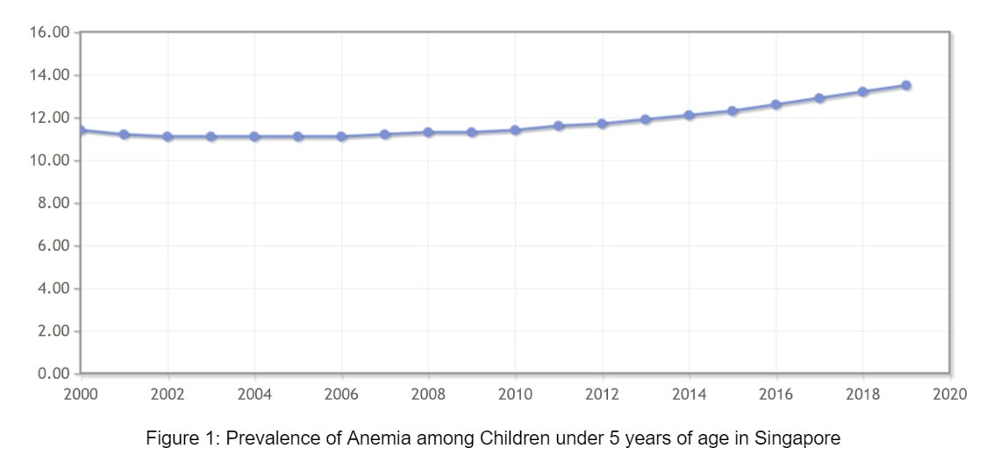

In [4]:
from IPython.display import Image
Image(filename = '/Users/winnie/Downloads/photo_2024-04-17 17.41.58.jpeg')

# Data cleaning for SC1015 Project 
### In this section, we will be cleaning the dataset so that all our datapoints will make relevant contributions to us determining a child's anemia's level. Therefore, providing us with the platform to gain insights into the key contributing factors to a child's anemia level 

In [1]:
# import all relevant libraries 
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt 
import plotly.express as px 
sb.set() # set the default Seaborn style for graphics
import statsmodels.graphics.mosaicplot as sp
import plotly.graph_objects as go

# Import essential models and functions from sklearn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

In [5]:
anemiaData = pd.read_csv('/Users/winnie/Library/CloudStorage/OneDrive-NanyangTechnologicalUniversity/y1s2/sc1015/project/children anemia.csv')
anemiaData.head(10)

,Age in 5-year groups,Type of place of residence,Highest educational level,Wealth index combined,Births in last five years,Age of respondent at 1st birth,Hemoglobin level adjusted for altitude and smoking (g/dl - 1 decimal),Anemia level,Have mosquito bed net for sleeping (from household questionnaire),Smokes cigarettes,Current marital status,Currently residing with husband/partner,When child put to breast,Had fever in last two weeks,Hemoglobin level adjusted for altitude (g/dl - 1 decimal),Anemia level.1,"Taking iron pills, sprinkles or syrup"
0,40-44,Urban,Higher,Richest,1,22,NaN,NaN,Yes,No,Living with partner,Staying elsewhere,Immediately,No,NaN,NaN,Yes
1,35-39,Urban,Higher,Richest,1,28,NaN,NaN,Yes,No,Married,Living with her,Hours: 1,No,NaN,NaN,No
2,25-29,Urban,Higher,Richest,1,26,NaN,NaN,No,No,Married,Living with her,Immediately,No,NaN,NaN,No
3,25-29,Urban,Secondary,Richest,1,25,95.0,Moderate,Yes,No,Married,Living with her,105.0,No,114.0,Not anemic,No
4,20-24,Urban,Secondary,Richest,1,21,NaN,NaN,Yes,No,No longer living together/separated,NaN,Immediately,No,NaN,NaN,No
5,30-34,Urban,Higher,Richest,1,30,113.0,Mild,Yes,No,Married,Living with her,NaN,No,119.0,Not anemic,No
6,35-39,Urban,Secondary,Richest,2,32,121.0,Not anemic,Yes,No,Married,Living with her,Immediately,No,102.0,Mild,Yes
7,35-39,Urban,Secondary,Richest,2,32,121.0,Not anemic,Yes,No,Married,Living with her,NaN,NaN,NaN,NaN,NaN
8,30-34,Urban,Secondary,Richest,1,32,NaN,NaN,Yes,No,Married,Living with her,Immediately,No,NaN,NaN,No
9,20-24,Urban,Secondary,Richest,1,19,108.0,Moderate,Yes,No,Married,Living with her,Immediately,No,113.0,Not anemic,Yes


In [6]:
anemiaData.shape

(33924, 17)

#### Initially there are 33924 rows and 17 columns in our dataset 

In [8]:
# Data Cleaning/ Checking the number of NULL values in each column
anemiaData.isnull().sum()

Age in 5-year groups                                                         0
Type of place of residence                                                   0
Highest educational level                                                    0
Wealth index combined                                                        0
Births in last five years                                                    0
Age of respondent at 1st birth                                               0
Hemoglobin level adjusted for altitude and smoking (g/dl - 1 decimal)    20788
Anemia level                                                             20788
Have mosquito bed net for sleeping (from household questionnaire)            0
Smokes cigarettes                                                            0
Current marital status                                                       0
Currently residing with husband/partner                                   1698
When child put to breast                            

#### To enhance our readability of our dataset, we will change the name of the respective columns 

In [9]:
# Renaming columns for better clarity and ease of analysis

anemiaData.rename(columns={'Age in 5-year groups': 'age',
                   'Type of place of residence': 'residence',
                   'Highest educational level': 'highest_education',
                   'Wealth index combined': 'wealth_index',
                   'Births in last five years': 'births_last5_years',
                   'Age of respondent at 1st birth': 'age_respondent_1st_birth',
                   'Hemoglobin level adjusted for altitude and smoking (g/dl - 1 decimal)': 'hemoglobin_altitude_smoking',
                   'Anemia level': 'mother_anemia_level',
                   'Have mosquito bed net for sleeping (from household questionnaire)': 'mosquito_bed_sleeping',
                   'Smokes cigarettes': 'smoking',
                   'Current marital status': 'status',
                   'Currently residing with husband/partner': 'residing_husband_partner',
                   'When child put to breast': 'child_put_breast',
                   'Had fever in last two weeks': 'fever_two_weeks',
                   'Hemoglobin level adjusted for altitude (g/dl - 1 decimal)': 'hemoglobin_altitude',
                   'Anemia level.1': 'child_anemia_level',
                   'Taking iron pills, sprinkles or syrup': 'iron_pills'}, inplace=True)
anemiaData.head()

,age,residence,highest_education,wealth_index,births_last5_years,age_respondent_1st_birth,hemoglobin_altitude_smoking,mother_anemia_level,mosquito_bed_sleeping,smoking,status,residing_husband_partner,child_put_breast,fever_two_weeks,hemoglobin_altitude,child_anemia_level,iron_pills
0,40-44,Urban,Higher,Richest,1,22,NaN,NaN,Yes,No,Living with partner,Staying elsewhere,Immediately,No,NaN,NaN,Yes
1,35-39,Urban,Higher,Richest,1,28,NaN,NaN,Yes,No,Married,Living with her,Hours: 1,No,NaN,NaN,No
2,25-29,Urban,Higher,Richest,1,26,NaN,NaN,No,No,Married,Living with her,Immediately,No,NaN,NaN,No
3,25-29,Urban,Secondary,Richest,1,25,95.0,Moderate,Yes,No,Married,Living with her,105.0,No,114.0,Not anemic,No
4,20-24,Urban,Secondary,Richest,1,21,NaN,NaN,Yes,No,No longer living together/separated,NaN,Immediately,No,NaN,NaN,No


#### Previously when we checked the number of NULL values in each column, there were 23742 NULL values for the children's anemia level. Hence, these datapoints would not contribute to our data since we are trying to find factors affecting children anemia level, leading to us dropping datasets without children anemia level

In [10]:
#Using Child Anemia Level as the base frame - only include rows with child anemia level indicator
# Filter rows where 'anemia_level_child' column is not null
anemiaData.dropna(subset=['child_anemia_level'],inplace = True)
#Rows and Columns in Data Frame
anemiaData.shape

(10182, 17)

#### Initially we thought of filling the empty datasets with NULL values for the child anemia level, however, that would affect the prediction

In [11]:
#Checking to see remaining rows with NULL values
anemiaData.isnull().sum()

age                               0
residence                         0
highest_education                 0
wealth_index                      0
births_last5_years                0
age_respondent_1st_birth          0
hemoglobin_altitude_smoking     120
mother_anemia_level             120
mosquito_bed_sleeping             0
smoking                           0
status                            0
residing_husband_partner        518
child_put_breast               3817
fever_two_weeks                   0
hemoglobin_altitude               0
child_anemia_level                0
iron_pills                        0
dtype: int64

#### As we can see from our data, there is a substantial amount of children with anemia who do not have any relevant data on them being put to breast and if their mum has a residing husband 

#### Since we do not have any idea on how these 2 factors may potentially affect a child's anemia level, let us rename from NULL to not stated and include them in our data analysis to understand these factors better 

In [12]:
#Filling the NULL value of mother_anemia_level
anemiaData['mother_anemia_level'] = anemiaData['mother_anemia_level'].fillna("Not stated")

#Filling the NULL value of residing_husband_partner
anemiaData['residing_husband_partner'] = anemiaData['residing_husband_partner'].fillna("Not stated")

/Users/winnie/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



<Axes: xlabel='hemoglobin_altitude_smoking', ylabel='Count'>

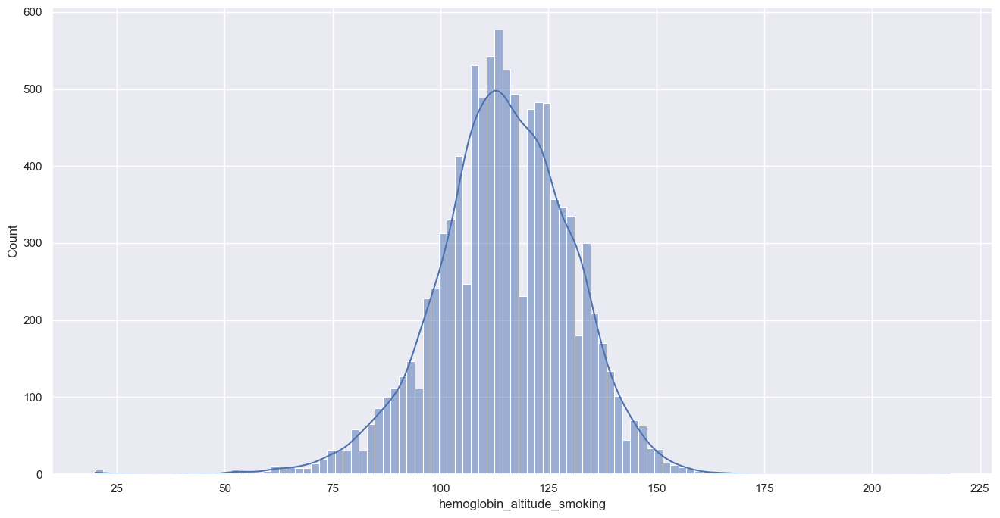

In [13]:
f = plt.figure(figsize=(16, 8))
sb.histplot(data = anemiaData['hemoglobin_altitude_smoking'], kde = True)

#### Since the hemoglobin altitude smoking variable is normally distributed, we can fill the NULL values with the mean

In [14]:
hemoglobin = pd.DataFrame(anemiaData['hemoglobin_altitude_smoking'])
child_level = pd.DataFrame(anemiaData['child_anemia_level'])
# to do: need to deal with NaN values 
mean_value = anemiaData['hemoglobin_altitude_smoking'].mean()
anemiaData['hemoglobin_altitude_smoking'].fillna(mean_value, inplace = True)

### Additionally, we decided to drop 'child_put_breast'.The row consisted of numerical and categorical data with minimal definition on kaggle, thus because our grp is unsure, we decided to drop the data.

In [15]:
data_type_counts = anemiaData['child_put_breast'].apply(type).value_counts()
print(data_type_counts)

child_put_breast
<class 'str'>      6365
<class 'float'>    3817
Name: count, dtype: int64


In [16]:
anemiaData.drop('child_put_breast',axis =1, inplace = True)

In [17]:
anemiaData.shape
anemiaData.isnull().sum()

age                            0
residence                      0
highest_education              0
wealth_index                   0
births_last5_years             0
age_respondent_1st_birth       0
hemoglobin_altitude_smoking    0
mother_anemia_level            0
mosquito_bed_sleeping          0
smoking                        0
status                         0
residing_husband_partner       0
fever_two_weeks                0
hemoglobin_altitude            0
child_anemia_level             0
iron_pills                     0
dtype: int64

#### We have cleaned the data and are able to use this dataframe to do exploratory analysis to understand which variables are the most crucial in affecting a children's anemia level
### End of Data Cleaning
# Data Visualisation
### Let's now take a look at our data. Since most of our variables are categorical in nature, let us get a better understanding of the distribution of each variable¶

In [18]:
#check the dimensions of our dataframe 
anemiaData.shape

(10182, 16)

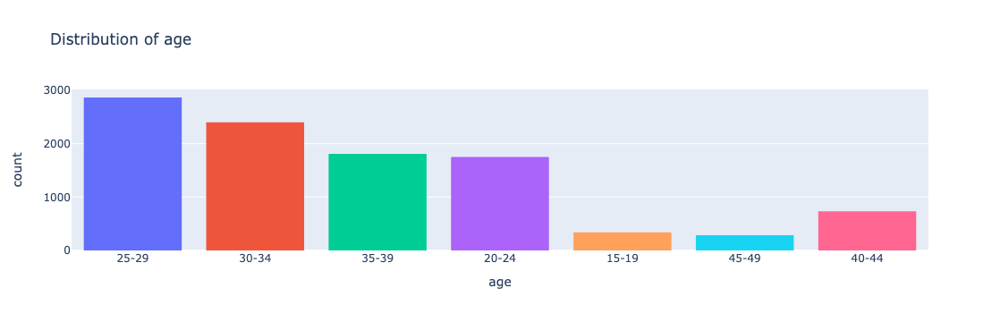

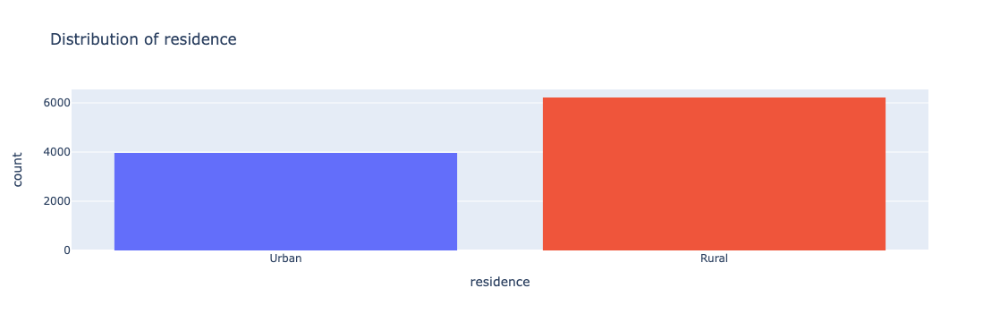

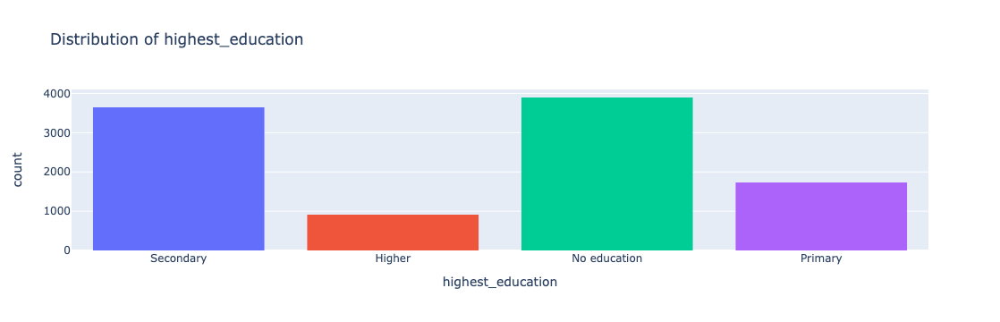

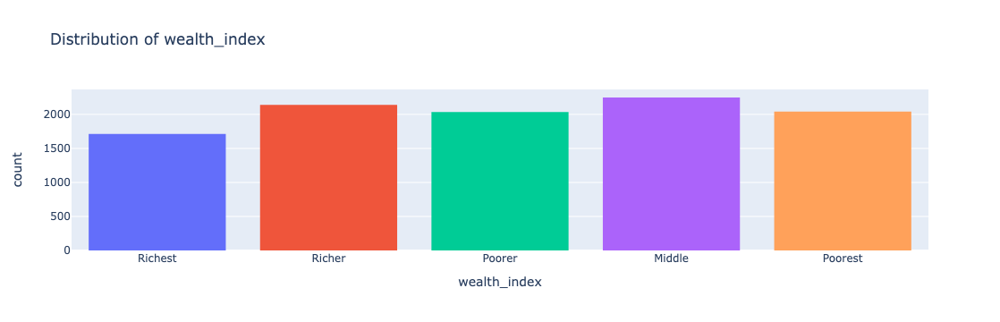

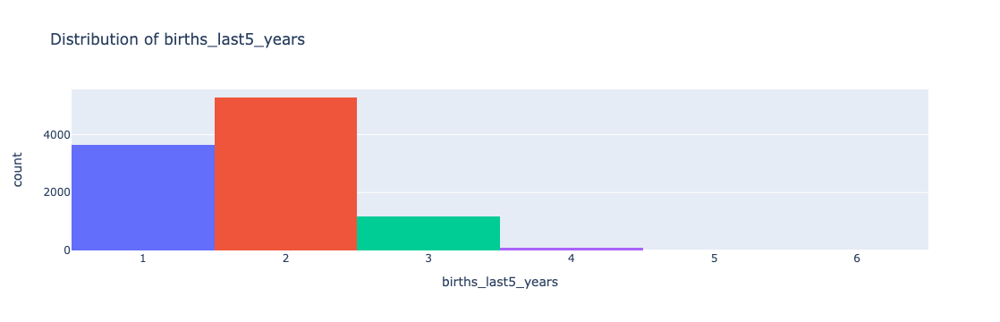

...

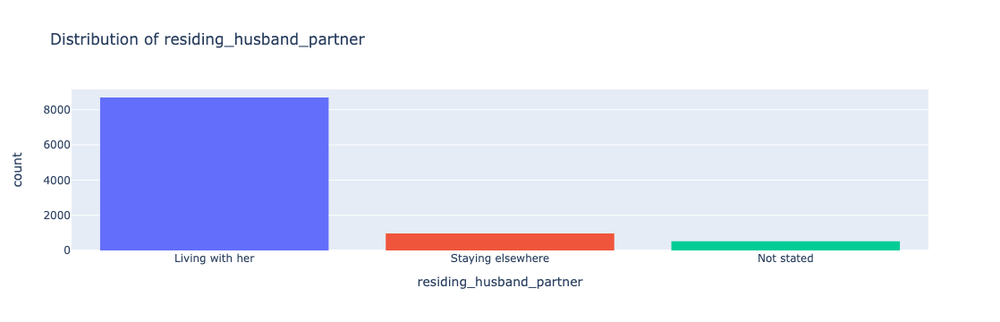

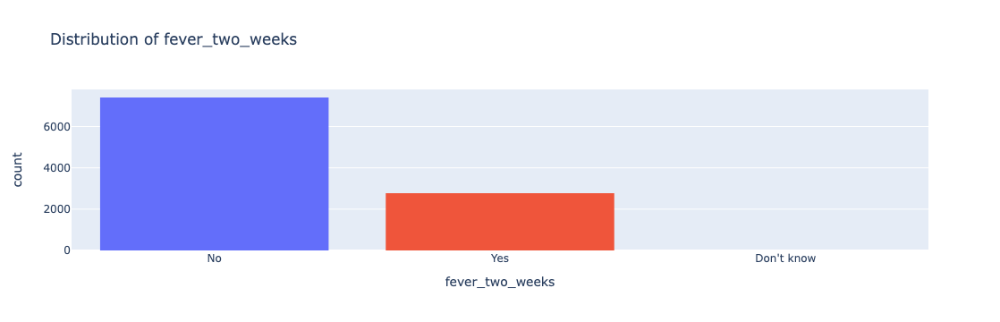

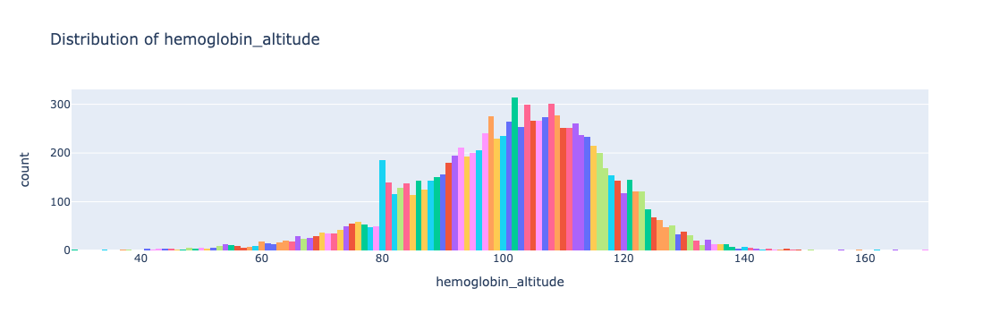

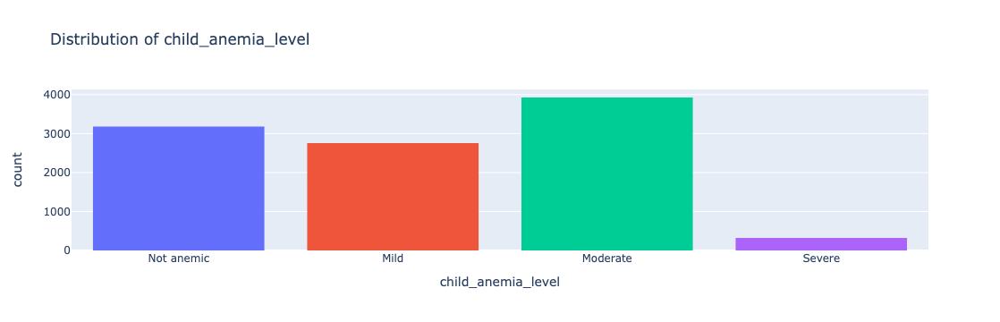

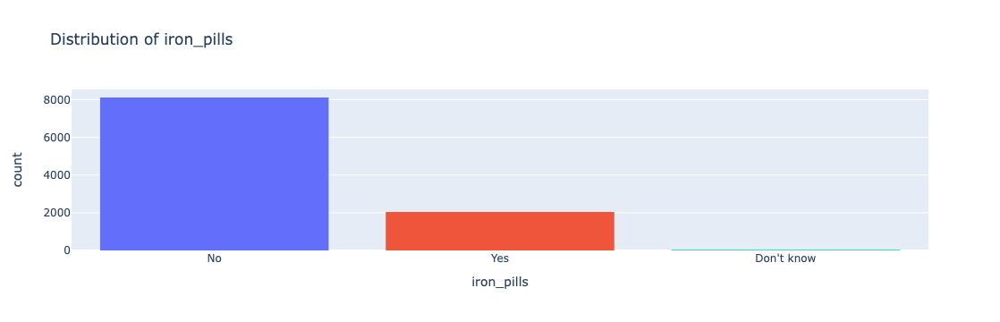

In [3]:
## Trying out facet histograms, to show the distribution of each variable
# Ignore index!
for column in anemiaData:
    fig = px.histogram(anemiaData, x=column, color=column,
                       title=f"Distribution of {column}")
    fig.update_layout(showlegend=False)
    fig.show()

## With a very skewed data for smoking and status, we will drop the column

In [19]:
# to drop smoking and status 
anemiaData.drop('smoking',axis =1, inplace = True)
anemiaData.drop('status', axis=1, inplace = True)

In [20]:
# View columns
print(list(anemiaData.columns))

['age', 'residence', 'highest_education', 'wealth_index', 'births_last5_years', 'age_respondent_1st_birth', 'hemoglobin_altitude_smoking', 'mother_anemia_level', 'mosquito_bed_sleeping', 'residing_husband_partner', 'fever_two_weeks', 'hemoglobin_altitude', 'child_anemia_level', 'iron_pills']


In [21]:
anemiaData.shape
# columns dropped: smoking, status and child put breast

(10182, 14)

## Let's explore our dataset a little with something new - parallel coordinates

In [22]:
## Setting colors for our diagram
Child_anemia_colors = {
    'Mild': 'lightpink',
    'Moderate': 'mediumvioletred',
    'Severe': 'rosybrown',
    'Not anemic' : 'peachpuff',
}

### We will split the diagram into 2, with different variables for each diagram, comparing to child anemia level
### First diagram has Age group, residence, education and wealth¶

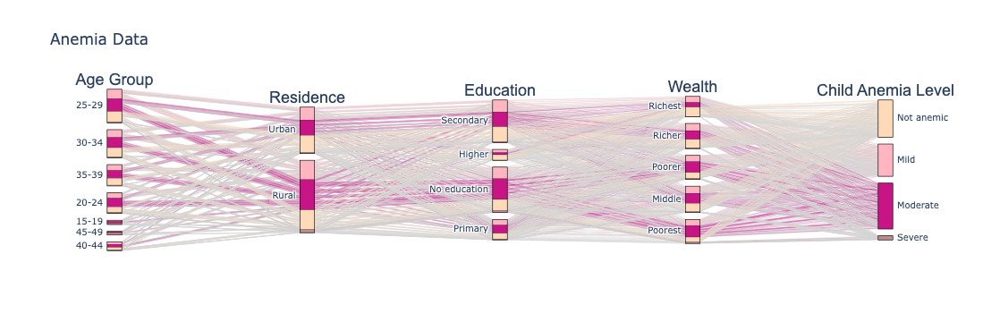

In [23]:
fig = go.Figure()

anemiaData['child_anemia_color'] = anemiaData['child_anemia_level'].map(Child_anemia_colors)
fig.add_trace(go.Parcats(
    dimensions=[
        {'label': 'Age Group', 'values': anemiaData['age']},
        {'label': 'Residence', 'values': anemiaData['residence']},
        {'label': 'Education', 'values': anemiaData['highest_education']},
        {'label': 'Wealth', 'values': anemiaData['wealth_index']},
        {'label': 'Child Anemia Level', 'values': anemiaData['child_anemia_level']},
        
    ],
    line={'color': anemiaData['child_anemia_color'], 'colorscale': 'Viridis'},
    hoveron='color', hoverinfo='all',
    labelfont={'size': 18, 'family': 'Arial'},
))

fig.update_layout(
    title="Anemia Data"
)

fig.show()

### Second diagram has Mother's anemia level, fever in the past 2 weeks, whether the child takes iron pills and whether they use mosquito nets

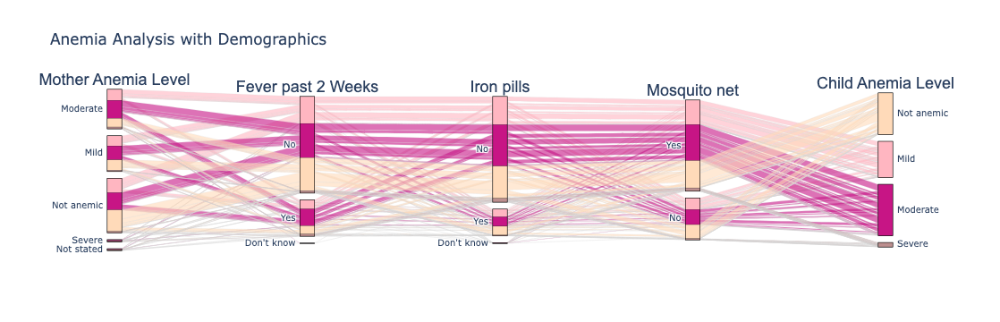

In [24]:
fig = go.Figure()

anemiaData['child_anemia_color'] = anemiaData['child_anemia_level'].map(Child_anemia_colors)
fig.add_trace(go.Parcats(
    dimensions=[
        {'label': 'Mother Anemia Level', 'values': anemiaData['mother_anemia_level']},
        {'label': 'Fever past 2 Weeks', 'values': anemiaData['fever_two_weeks']},
        {'label': 'Iron pills', 'values': anemiaData['iron_pills']},
        {'label': 'Mosquito net', 'values': anemiaData['mosquito_bed_sleeping']},
        {'label': 'Child Anemia Level', 'values': anemiaData['child_anemia_level']},
        
    ],
    line={'color': anemiaData['child_anemia_color'], 'colorscale': 'Viridis'},
    hoveron='color', hoverinfo='all',
    labelfont={'size': 18, 'family': 'Arial'},
))

fig.update_layout(
    title="Anemia Analysis with Demographics"
)

fig.show()